#### GUI Development

In [1]:
import ipywidgets as widgets
from ipywidgets import Dropdown, Checkbox, IntSlider, VBox, HBox
import matplotlib.pyplot as plt

from IPython.display import display
import tkinter as tk
from tkinter import ttk

#from data.graph_data import *
from ba_utils.visualization import *
from ba_utils.orderings import *

import ba_utils.data_generator as dg
import ba_utils.network_rugs as nrugs

from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg

In [ ]:
a = widgets.FloatText()
b = widgets.FloatSlider()
display(a,b)
mylink = widgets.jslink((a, 'value'), (b, 'value'))

In [4]:
def draw_networkrug(graphs, color_encoding='closeness_centrality', labels=False, pixel_size=6):
    """
    Draws a single NetworkRug with a specific color encoding and pixel size.
    Adjusts figure size dynamically to support scalability in node/time dimensions.
    """
    ordering = get_priority_bfs_ordering(graphs)

    fig = draw_rug_from_graphs(
        graphs_data=graphs,
        ordering=ordering,
        color_encoding=color_encoding,
        labels=labels,
        pixel_size=pixel_size
    )
    return fig
#draw_networkrug(merge_graphs, color_encoding='closeness_centrality', labels=False, pixel_size=12)

In [ ]:
def interactive_rug(graphs):
    color_options = ['id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'eigenvector_centrality']
    color_dropdown = widgets.Dropdown(options=color_options, value='id', description='Color:')
    label_toggle = widgets.Checkbox(value=False, description='Show Labels')
    
    pixel_slider = widgets.IntSlider(
        value=6,
        min=2,
        max=20,
        step=1,
        description='Pixel Size:',
        continuous_update=False
    )

    ui = widgets.VBox([widgets.HBox([color_dropdown, label_toggle, pixel_slider])])

    def update_plot(change=None):
        draw_networkrug(
            graphs,
            color_encoding=color_dropdown.value,
            labels=label_toggle.value,
            pixel_size=pixel_slider.value
        )

    # Register observers
    color_dropdown.observe(update_plot, names='value')
    label_toggle.observe(update_plot, names='value')
    pixel_slider.observe(update_plot, names='value')

    display(ui)
    update_plot()
#interactive_rug(merge_graphs)

num_artists 120
id_mapper: colormap created with turbo and 0 to 119


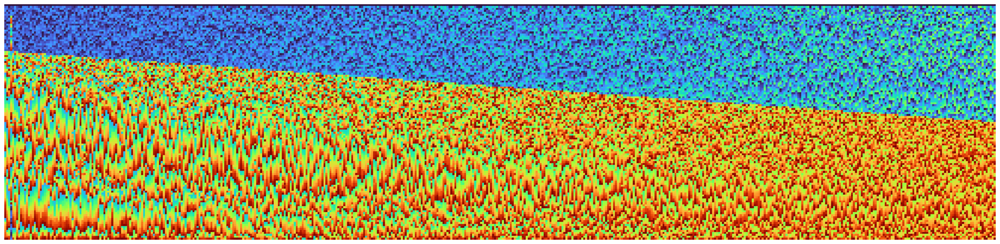

In [6]:
merge_graphs, _, _ = dg.generate_proportional_transition(
    num_steps=500,
    num_nodes=120,
    initial_state={0:20, 1:80},
    final_state={0:50, 1:50},
    seed=42
)
nrugs.interactive_rug(merge_graphs)

num_artists 120
id_mapper: colormap created with turbo and 0 to 119


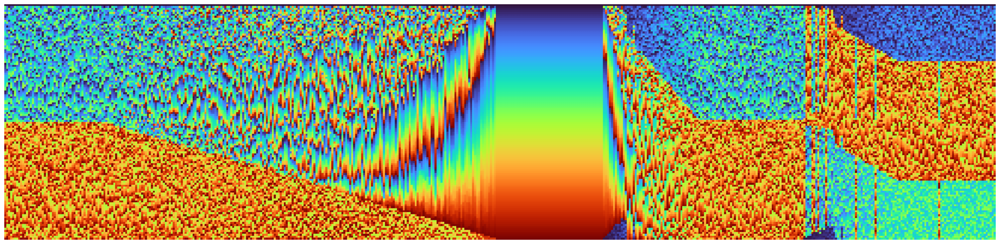

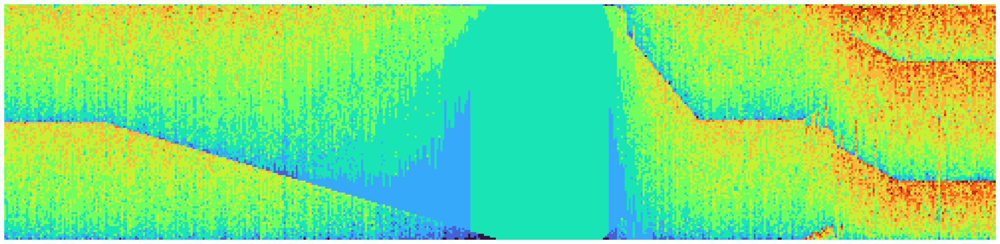

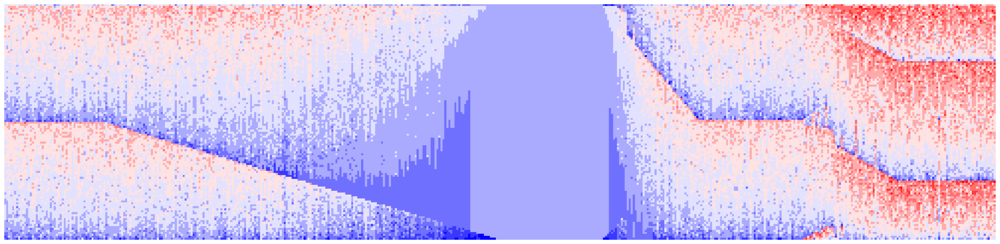

In [15]:
merge_graphs, _, _ = dg.generate_dynamic_graphs(
    num_steps=500,
    num_nodes=120,
    initial_groups=2,
    split_events={300: [(0, 50)], 400: [(1, 50)]},
    merge_events={50: [(1, 0, 200)]},
    seed=42
)
nrugs.interactive_rug(merge_graphs)

[t=50] New group created from split: 1
[t=300] New group created from split: 2
[t=300] New group created from split: 3


num_artists 100
id_mapper: colormap created with turbo and 0 to 99


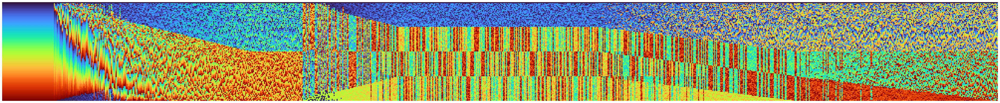

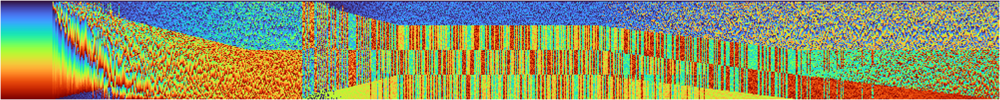

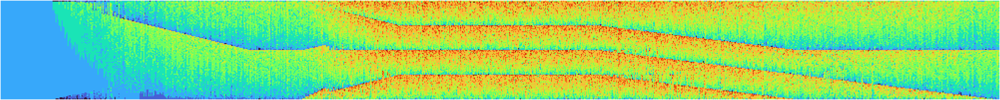

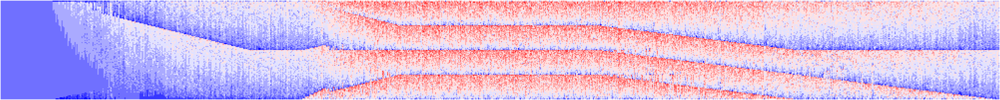

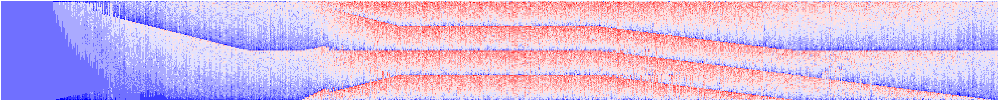

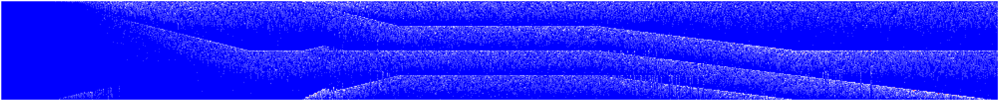

In [ ]:
merge_graphs, gt, cl = dg.generate_dynamic_graphs(
    num_steps=1000,
    num_nodes=100,
    initial_groups=1,
    split_events={50: [(0, 200)], 300: [(0, 100),(1, 100)]},
    merge_events={600: [(2, 3, 200)], 800: [(0, 1, 200)]},
    seed=42
)
nrugs.interactive_rug(merge_graphs)

In [25]:
for t in cl:
    print(f"Step {t}: {len(cl[t])} nodes changed — {cl[t]}")

Step 1: 0 nodes changed — []
Step 2: 0 nodes changed — []
Step 3: 0 nodes changed — []
Step 4: 0 nodes changed — []
Step 5: 0 nodes changed — []
Step 6: 0 nodes changed — []
Step 7: 0 nodes changed — []
Step 8: 0 nodes changed — []
Step 9: 0 nodes changed — []
Step 10: 0 nodes changed — []
Step 11: 0 nodes changed — []
Step 12: 0 nodes changed — []
Step 13: 0 nodes changed — []
Step 14: 0 nodes changed — []
Step 15: 0 nodes changed — []
Step 16: 0 nodes changed — []
Step 17: 0 nodes changed — []
Step 18: 0 nodes changed — []
Step 19: 0 nodes changed — []
Step 20: 0 nodes changed — []
Step 21: 0 nodes changed — []
Step 22: 0 nodes changed — []
Step 23: 0 nodes changed — []
Step 24: 0 nodes changed — []
Step 25: 0 nodes changed — []
Step 26: 0 nodes changed — []
Step 27: 0 nodes changed — []
Step 28: 0 nodes changed — []
Step 29: 0 nodes changed — []
Step 30: 0 nodes changed — []
Step 31: 0 nodes changed — []
Step 32: 0 nodes changed — []
Step 33: 0 nodes changed — []
Step 34: 0 nodes ch

Initial assignment (round-robin)


num_artists 120
id_mapper: colormap created with turbo and 0 to 119


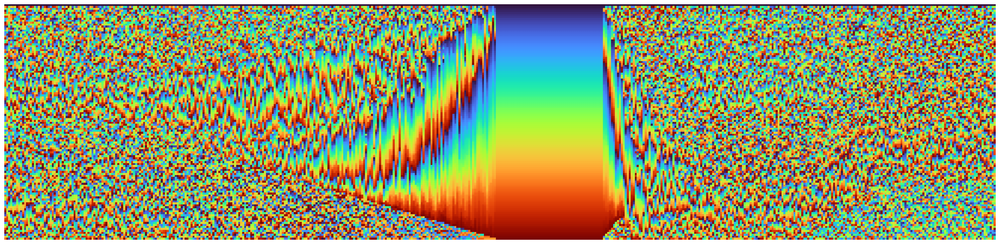

In [16]:
merge_graphs, _, _ = dg.generate_dynamic_graphs(
    num_steps=500,
    num_nodes=120,
    initial_groups=2,
    split_events={300: [(0, 50)], 400: [(1, 50)]},
    merge_events={50: [(1, 0, 200)]},
    init_mode='random',
    seed=42
)
nrugs.interactive_rug(merge_graphs)

Initial assignment (round-robin)


num_artists 120
id_mapper: colormap created with turbo and 0 to 119


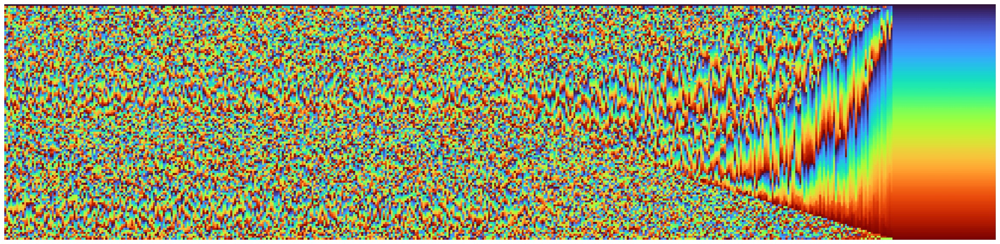

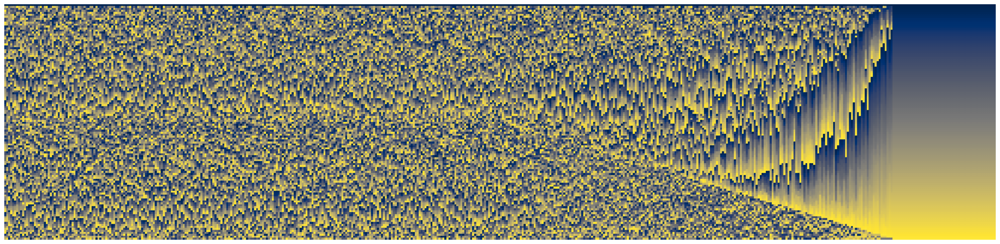

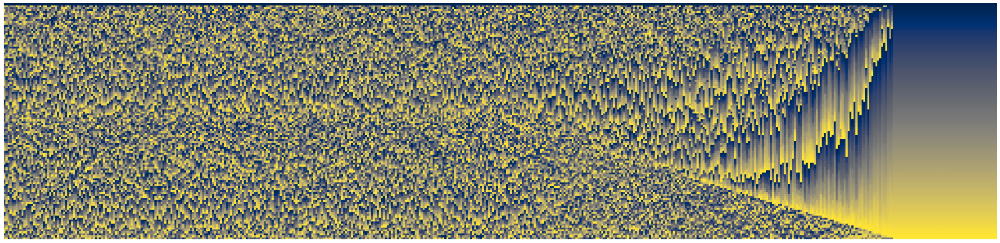

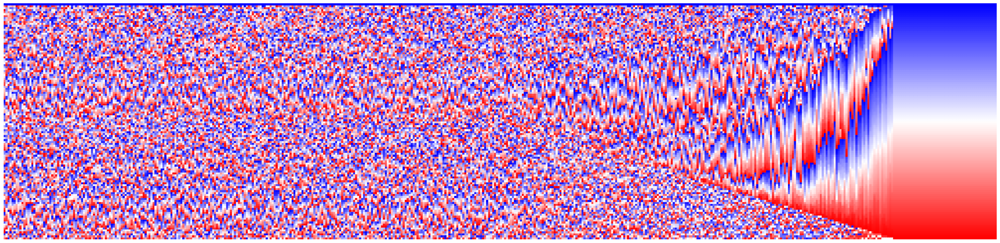

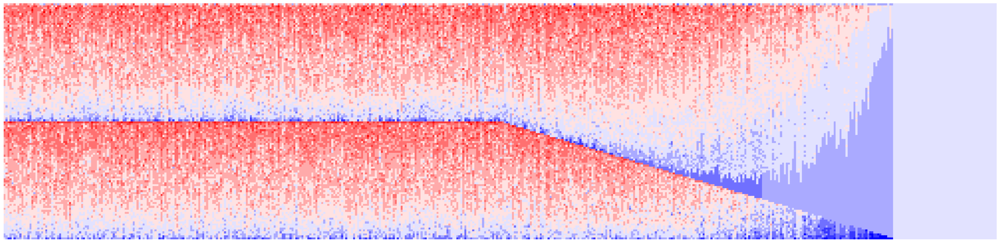

In [ ]:
merge_graphs, _, _ = dg.generate_dynamic_graphs(
    num_steps=500,
    num_nodes=120,
    initial_groups=2,
    merge_events={250: [(1, 0, 200)]},
    init_mode='random',
    seed=42
)
nrugs.interactive_rug(merge_graphs)

In [ ]:
root = tk.Tk()

label1 = tk.Label(root, text="Hallo World!")
label1.pack()

root.mainloop()

In [9]:
#main functionality in network_rugs.py
import ba_utils.network_rugs as nrugs

nrugs.launch_tkinter_ui(merge_graphs)

num_artists 24
colormap created with turbo and 1 to 24


In [2]:
def draw_networkrug(graphs, color_encoding='closeness_centrality', colormap='turbo', labels=False, pixel_size=6, order="", ax=None, start_nodes=None):
    """
    Draws a single NetworkRug with a specific color encoding and pixel size.
    Adjusts figure size dynamically to support scalability in node/time dimensions.
    calls draw_rug_from_graphs() from visualization.py
    
    Use this for start_nodes
    start_nodes = {timestamp: 15 for timestamp in test.keys()}
    """
    if order == "prio":
        ordering = get_priority_bfs_ordering(graphs, start_nodes)
    if order == "bfs":
        ordering = get_BFS_ordering(graphs, start_nodes, sorting_key='weight')
    if order == "dfs":
        ordering = get_DFS_ordering(graphs, start_nodes)
    if order == "degree":
        ordering = get_centrality_ordering(graphs, centrality_measure="degree")
    else:
        ordering = get_priority_bfs_ordering(graphs, start_nodes)

    fig = draw_rug_from_graphs(
        graphs_data=graphs,
        ordering=ordering,
        color_encoding=color_encoding,
        colormap= colormap,
        labels=labels,
        pixel_size=pixel_size,
        ax=ax
    )

    return fig

# --- Jupyter Notebook Interface ---
def interactive_rug(graphs):
    color_options = ['id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality']
    color_dropdown = Dropdown(options=color_options, value='id', description='Color:')
    
    colormap_option = ['turbo', 'gist_rainbow', 'ocean', 'rainbow', 'bwr', 'viridis', 'plasma', 'cividis']
    colormap_dropdown = Dropdown(options=colormap_option, value='turbo', description='Colormap:')
    
    label_toggle = Checkbox(value=False, description='Show Labels')
    pixel_slider = IntSlider(value=6, min=2, max=20, step=1, description='Pixel Size:', continuous_update=False)
    
    ui = VBox([HBox([color_dropdown, colormap_dropdown, label_toggle, pixel_slider])])

    def update_plot(change=None):
        draw_networkrug(graphs, color_encoding=color_dropdown.value, colormap=colormap_dropdown.value, labels=label_toggle.value, pixel_size=pixel_slider.value)

    color_dropdown.observe(update_plot, names='value')
    colormap_dropdown.observe(update_plot, names='value')
    label_toggle.observe(update_plot, names='value')
    pixel_slider.observe(update_plot, names='value')

    display(ui)
    update_plot()


# --- Tkinter GUI Interface ---
def launch_tkinter_ui(graphs):
    def render():
        fig = plt.Figure()
        ax = fig.add_subplot(111)
        draw_networkrug(
            graphs,
            color_encoding=color_var.get(),
            colormap=colormap_box.get(),
            labels=label_var.get(),
            pixel_size=pixel_var.get(),
            ax=ax
        )
        for widget in canvas_frame.winfo_children():
            widget.destroy()
        canvas = FigureCanvasTkAgg(fig, master=canvas_frame)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)

    def update_pixel_label(value):
        pixel_value_label.config(text=f"{int(float(value))} px")

    root = tk.Tk()
    root.title("NetworkRug Visualizer")
    #window.geometry("widthxheight+XPOS+YPOS")
    root.geometry("1600x800")  # Default window size

    # --- Variables ---
    color_var = tk.StringVar(value='closeness_centrality')
    colormap_var = tk.StringVar(value='turbo')
    label_var = tk.BooleanVar()
    pixel_var = tk.IntVar(value=6)

    # --- Control Frame ---
    control_frame = ttk.Frame(root)
    control_frame.pack(side='top', pady=10)

    # --- Color Dropdown ---
    ttk.Label(control_frame, text="Color Encoding:").grid(row=0, column=0, sticky='e', padx=5)
    color_box = ttk.Combobox(control_frame, textvariable=color_var, values=[
        'id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality'])
    color_box.grid(row=0, column=1, padx=5)
    
    # --- Colormap Dropdown ---
    ttk.Label(control_frame, text="Colormap:").grid(row=0, column=3, sticky='e', padx=5)
    colormap_box = ttk.Combobox(control_frame, textvariable=colormap_var, values=[
        'turbo', 'gist_rainbow', 'ocean', 'rainbow', 'bwr', 'viridis', 'plasma', 'cividis'])
    colormap_box.grid(row=0, column=4, padx=5)
    

    # --- Label Checkbox ---
    ttk.Checkbutton(control_frame, text="Show Labels", variable=label_var).grid(row=0, column=2, padx=5)

    # --- Pixel Size Slider + Label ---
    ttk.Label(control_frame, text="Pixel Size:").grid(row=1, column=0, sticky='e', padx=5)
    pixel_slider = ttk.Scale(control_frame, variable=pixel_var, from_=2, to=20, orient='horizontal',
                             command=update_pixel_label)
    pixel_slider.grid(row=1, column=1, sticky='we', padx=5)
    pixel_value_label = ttk.Label(control_frame, text=f"{pixel_var.get()} px")
    pixel_value_label.grid(row=1, column=2, padx=5)

    # --- Render Button ---
    ttk.Button(control_frame, text="Render", command=render).grid(row=2, column=0, columnspan=3, pady=10)

    # --- Canvas for Plot ---
    canvas_frame = ttk.Frame(root)
    canvas_frame.pack(side='bottom', fill='both', expand=True)

    root.mainloop()


In [3]:
launch_tkinter_ui(merge_graphs)

NameError: name 'merge_graphs' is not defined

### Application with 2 pages

In [4]:
import tkinter as tk

class App(tk.Tk):
    def __init__(self):
        super().__init__()
        self.title("Multi-Page App")
        self.geometry("400x300")

        # Container to stack frames (pages)
        container = tk.Frame(self)
        container.pack(fill="both", expand=True)

        self.frames = {}

        for F in (HomePage, SettingsPage):
            page_name = F.__name__
            frame = F(parent=container, controller=self)
            self.frames[page_name] = frame
            frame.grid(row=0, column=0, sticky="nsew")

        self.show_frame("HomePage")

    def show_frame(self, page_name):
        '''Raise the selected frame'''
        frame = self.frames[page_name]
        frame.tkraise()

class HomePage(tk.Frame):
    def __init__(self, parent, controller):
        super().__init__(parent)
        self.controller = controller

        label = tk.Label(self, text="🏠 Home Page", font=("Arial", 18))
        label.pack(pady=20)

        go_to_settings = tk.Button(self, text="Go to Settings",
                                   command=lambda: controller.show_frame("SettingsPage"))
        go_to_settings.pack()

class SettingsPage(tk.Frame):
    def __init__(self, parent, controller):
        super().__init__(parent)
        self.controller = controller

        label = tk.Label(self, text="⚙️ Settings Page", font=("Arial", 18))
        label.pack(pady=20)

        go_home = tk.Button(self, text="Back to Home",
                            command=lambda: controller.show_frame("HomePage"))
        go_home.pack()

if __name__ == "__main__":
    app = App()
    app.mainloop()


### Combination of Generate and Visualize in GUI     - HIER GEHT DAS ORDERING AUSWÄHLEN NOCH!

In [4]:
import tkinter as tk
from tkinter import ttk
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg

import networkx as nx

from ba_utils.data_generator import generate_split_merge_data
import ba_utils.visualization as visualization
from ba_utils.orderings import get_priority_bfs_ordering, get_DFS_ordering, get_BFS_ordering

# Global graph data
graphs_data = {}

def open_rug_window():
    if not graphs_data:
        print("No graphs generated yet.")
        return

    rug_window = tk.Toplevel()
    rug_window.title("NetworkRug Visualizer")
    rug_window.geometry("1600x900")

    color_options = ['id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality']
    ordering_options = ['priority', 'dfs', 'bfs']
    colormap_options = ['turbo', 'gist_rainbow', 'ocean', 'rainbow', 'bwr', 'viridis', 'plasma', 'cividis']

    color_var = tk.StringVar(value='closeness_centrality')
    order_var = tk.StringVar(value='priority')
    pixel_var = tk.IntVar(value=6)
    label_var = tk.BooleanVar()
    colormap_var = tk.StringVar(value='turbo')

    control_frame = ttk.Frame(rug_window)
    control_frame.pack(side='top', fill='x', pady=10)

    ttk.Label(control_frame, text="Color Encoding").grid(row=0, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=color_var, values=color_options).grid(row=0, column=1, padx=5)

    ttk.Label(control_frame, text="Colormap").grid(row=0, column=2, padx=5)
    ttk.Combobox(control_frame, textvariable=colormap_var, values=colormap_options).grid(row=0, column=3, padx=5)

    ttk.Label(control_frame, text="Ordering").grid(row=1, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=order_var, values=ordering_options).grid(row=1, column=1, padx=5)

    ttk.Checkbutton(control_frame, text="Show Labels", variable=label_var).grid(row=1, column=2, padx=5)
    ttk.Label(control_frame, text="Pixel Size").grid(row=1, column=3, padx=5)
    ttk.Scale(control_frame, from_=2, to=20, variable=pixel_var, orient='horizontal').grid(row=1, column=4, padx=5)

    rug_canvas = ttk.Frame(rug_window)
    rug_canvas.pack(fill='both', expand=True)

    def render_rug():
        fig = plt.Figure()
        ax = fig.add_subplot(111)

        ordering_fn = {
            'priority': get_priority_bfs_ordering,
            'dfs': get_DFS_ordering,
            'bfs': lambda g: get_BFS_ordering(g, sorting_key='weight')
        }[order_var.get()]

        ordering = ordering_fn(graphs_data)

        visualization.draw_rug_from_graphs(
            graphs_data,
            ordering=ordering,
            color_encoding=color_var.get(),
            colormap=colormap_var.get(),
            labels=label_var.get(),
            pixel_size=pixel_var.get(),
            ax=ax
        )

        for widget in rug_canvas.winfo_children():
            widget.destroy()

        canvas = FigureCanvasTkAgg(fig, master=rug_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)

    ttk.Button(control_frame, text="Render Rug", command=render_rug).grid(row=2, column=0, columnspan=5, pady=10)

def start_gui():
    global graphs_data
    root = tk.Tk()
    root.title("NetworkRug Generator")
    root.geometry("800x600")

    left_frame = ttk.Frame(root)
    left_frame.pack(fill='both', expand=True)

    num_nodes_var = tk.IntVar(value=30)
    num_steps_var = tk.IntVar(value=10)
    num_groups_var = tk.IntVar(value=1)
    split_time_var = tk.IntVar(value=2)
    split_duration_var = tk.IntVar(value=4)
    merge_time_var = tk.IntVar(value=0)
    merge_duration_var = tk.IntVar(value=0)

    def labeled_entry(parent, text, variable, row):
        ttk.Label(parent, text=text).grid(row=row, column=0, sticky='e', padx=5)
        ttk.Entry(parent, textvariable=variable).grid(row=row, column=1, padx=5)

    for i, (label, var) in enumerate([
        ("Num Nodes", num_nodes_var),
        ("Num Steps", num_steps_var),
        ("Initial Groups", num_groups_var),
        ("Split Time", split_time_var),
        ("Split Duration", split_duration_var),
        ("Merge Time", merge_time_var),
        ("Merge Duration", merge_duration_var)
    ]):
        labeled_entry(left_frame, label, var, i)

    left_canvas = ttk.Frame(left_frame)
    left_canvas.grid(row=9, column=0, columnspan=2, pady=10, sticky='nsew')

    def generate_and_visualize():
        global graphs_data
        graphs, _, _ = generate_split_merge_data(
            num_nodes=num_nodes_var.get(),
            num_steps=num_steps_var.get(),
            initial_groups=num_groups_var.get(),
            split_time=split_time_var.get(),
            split_duration=split_duration_var.get(),
            merge_time=merge_time_var.get(),
            merge_duration=merge_duration_var.get()
        )
        graphs_data = graphs

        for widget in left_canvas.winfo_children():
            widget.destroy()

        fig = plt.Figure(figsize=(8, 5))
        timestamps = list(graphs.keys())
        cols = 5
        rows = (len(timestamps) + cols - 1) // cols

        for i, (timestamp, G) in enumerate(graphs.items()):
            ax = fig.add_subplot(rows, cols, i + 1)
            pos = nx.spring_layout(G)
            nx.draw(G, pos, with_labels=True, node_size=300, font_size=8, font_color='white', ax=ax)
            ax.set_title(str(timestamp), fontsize=8)

        canvas = FigureCanvasTkAgg(fig, master=left_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)
        print("Graphs visualized")

    ttk.Button(left_frame, text="Generate & Show Graphs", command=generate_and_visualize).grid(row=8, column=0, columnspan=2, pady=10)
    ttk.Button(left_frame, text="Open NetworkRug Viewer", command=open_rug_window).grid(row=10, column=0, columnspan=2, pady=10)

    root.mainloop()

In [ ]:
start_gui()

### Updates from the train (newest version)


In [1]:
import tkinter as tk
from tkinter import ttk
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import networkx as nx

from datetime import datetime
import os

import ba_utils.color as colorMap
import ba_utils.network_rugs as nrugs

import ba_utils.data_generator as dg
import ba_utils.visualization as visualization
from ba_utils.orderings import get_priority_bfs_ordering, get_DFS_ordering, get_BFS_ordering

# Global graph data
graphs_data = {}

def open_rug_window():
    if not graphs_data:
        print("No graphs generated yet.")
        return

    rug_window = tk.Toplevel()
    rug_window.title("NetworkRug Visualizer")
    rug_window.geometry("1600x900")

    color_options = ['id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality']
    ordering_options = ['priority', 'dfs', 'bfs']
    colormap_options = ['turbo', 'gist_rainbow', 'ocean', 'rainbow', 'bwr', 'viridis', 'plasma', 'cividis']
    colormap_type_options = ['linear', 'binned']

    color_var = tk.StringVar(value='id')
    order_var = tk.StringVar(value='priority')
    label_var = tk.BooleanVar()
    mapper_type_var = tk.StringVar(value='linear')
    colormap_var = tk.StringVar(value='turbo')

    control_frame = ttk.Frame(rug_window)
    control_frame.pack(side='top', fill='x', pady=10)

    ttk.Label(control_frame, text="Color Encoding").grid(row=0, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=color_var, values=color_options).grid(row=0, column=1, padx=5)

    ttk.Label(control_frame, text="Colormap").grid(row=0, column=2, padx=5)
    ttk.Combobox(control_frame, textvariable=colormap_var, values=colormap_options).grid(row=0, column=3, padx=5)

    # --- Mapper Type Dropdown ---
    ttk.Label(control_frame, text="Color Mapping Type:").grid(row=0, column=4, sticky='e', padx=5)
    ttk.Combobox(control_frame, textvariable=mapper_type_var, values=colormap_type_options).grid(row=0, column=5, padx=5)

    ttk.Label(control_frame, text="Ordering").grid(row=1, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=order_var, values=ordering_options).grid(row=1, column=1, padx=5)

    ttk.Checkbutton(control_frame, text="Show Labels", variable=label_var).grid(row=1, column=4, padx=5)

    rug_canvas = ttk.Frame(rug_window)
    rug_canvas.pack(fill='both', expand=True)

    def render_rug():
        fig = plt.Figure()
        ax = fig.add_subplot(111)

        start_nodes = None

        if order_var.get() == "priority":
            ordering = get_priority_bfs_ordering(graphs_data, start_nodes)
            print("Using priority BFS ordering")
        if order_var.get() == "bfs":
            ordering = get_BFS_ordering(graphs_data, start_nodes, sorting_key='weight')
        if order_var.get() == "dfs":
            ordering = get_DFS_ordering(graphs_data, start_nodes)
            print("Using DFS ordering")
        if order_var.get() == "degree":
            ordering = get_centrality_ordering(graphs_data, centrality_measure="degree")
        else:
            ordering = get_priority_bfs_ordering(graphs_data, start_nodes)

        fig, color_mapping = visualization.draw_rug_with_color_mapping(
            graphs_data,
            ordering=ordering,
            color_encoding=color_var.get(),
            colormap=colormap_var.get(),
            mapper_type=mapper_type_var.get(),            
            labels=label_var.get(),
            pixel_size=40,  # fixed for click mapping
            ax=ax
        )

        for widget in rug_canvas.winfo_children():
            widget.destroy()

        canvas = FigureCanvasTkAgg(fig, master=rug_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)

        def on_click(event):
            if event.inaxes is None or not hasattr(event, 'xdata') or not hasattr(event, 'ydata'):
                return
            try:
                x, y = int(event.xdata), int(event.ydata)
                pixel_size = 40
                t_idx = x // pixel_size
                y_idx = y // pixel_size

                timestamps = sorted(graphs_data.keys())
                if t_idx >= len(timestamps):
                    return
                timestamp = timestamps[t_idx]
                node_ordering = ordering[timestamp]
                if y_idx >= len(node_ordering):
                    return
                node_id = node_ordering[y_idx]

                print(f"Clicked on time={timestamp}, node={node_id}")

                # Open graph at timestamp
                fig_graph = plt.Figure(figsize=(4, 4))
                ax_graph = fig_graph.add_subplot(111)
                G = graphs_data[timestamp]
                pos = nx.spring_layout(G)
                
                node_colors = [color_mapping.get((timestamp, n), 'C0') for n in G.nodes()]

                nx.draw(G, pos, with_labels=True, node_size=200, font_size=8, font_color='white', node_color=node_colors, ax=ax_graph)
                
                ax_graph.set_title(f"Graph at t={timestamp}")

                win = tk.Toplevel()
                win.title(f"Graph at t={timestamp}")
                canvas_graph = FigureCanvasTkAgg(fig_graph, master=win)
                canvas_graph.draw()
                canvas_graph.get_tk_widget().pack(fill='both', expand=True)
            

            except Exception as e:
                print("Error processing click:", e)

        canvas.mpl_connect("button_press_event", on_click)
        return fig
    
    render_rug()
    ttk.Button(control_frame, text="Render Rug", command=render_rug).grid(row=2, column=0, columnspan=4, pady=10)

    def save_figure():
        fig = render_rug()
        if fig:
            timestamp_str = datetime.now().strftime("%Y%m%d_%H%M%S")
            config_str = (
                f"color_{color_var.get()}__"
                f"order_{order_var.get()}__"
                f"cmap_{colormap_var.get()}__"
                f"num_nodes_{len(next(iter(graphs_data.values())))}__"
                f"time_steps_{len(graphs_data)}__"
            )
            filename = f"networkrug__{config_str}__{timestamp_str}.png"
            os.makedirs("outputs", exist_ok=True)
            full_path = os.path.join("outputs", filename)

            fig.savefig(full_path, dpi=300, bbox_inches='tight')
            print(f"Figure saved as {full_path}")

    ttk.Button(control_frame, text="Save as PNG", command=save_figure).grid(row=2, column=4, columnspan=2, pady=10)


def start_gui():
    global graphs_data
    root = tk.Tk()
    root.title("NetworkRug Generator")
    root.geometry("800x1600")

    left_frame = ttk.Frame(root)
    for i in range(4):  # assuming you use up to column 3
        left_frame.columnconfigure(i, weight=1)

    left_frame.pack(fill='both', expand=True)

    num_nodes_var = tk.IntVar(value=30)
    num_steps_var = tk.IntVar(value=100)
    intra_strength_var = tk.DoubleVar(value=0.8)
    inter_strength_var = tk.DoubleVar(value=0.1)
    mode_var = tk.StringVar(value='timed')

    ttk.Label(left_frame, text="Num Nodes").grid(row=0, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=num_nodes_var).grid(row=0, column=1)
    ttk.Label(left_frame, text="Timesteps").grid(row=1, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=num_steps_var).grid(row=1, column=1)
    ttk.Label(left_frame, text="Intra Strength").grid(row=2, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=intra_strength_var).grid(row=2, column=1)
    ttk.Label(left_frame, text="Inter Strength").grid(row=3, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=inter_strength_var).grid(row=3, column=1)

    ttk.Label(left_frame, text="Generation Mode").grid(row=4, column=0)
    mode_dropdown = ttk.Combobox(left_frame, textvariable=mode_var, values=["timed", "proportioned"])
    mode_dropdown.grid(row=4, column=1)

    dynamic_widgets_frame = ttk.Frame(left_frame)
    dynamic_widgets_frame.grid(row=0, column=2, rowspan=5, sticky='nw', padx=10, pady=5)
    input_state_var = tk.StringVar(value="{0:25,1:25,2:25,3:25}")
    final_state_var = tk.StringVar(value="{0:10,1:50,2:20,3:20}")
    initial_groups_var = tk.StringVar(value="1")
    init_mode_var = tk.StringVar(value="block")
    split_events_var = tk.StringVar(value="{10: [(0, 5)]}")
    merge_events_var = tk.StringVar(value="{}")

    def update_dynamic_inputs(*args):
        for widget in dynamic_widgets_frame.winfo_children():
            widget.destroy()

        if mode_var.get() == "proportioned":
            ttk.Label(dynamic_widgets_frame, text="Initial State").grid(row=0, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=input_state_var).grid(row=0, column=1)
            ttk.Label(dynamic_widgets_frame, text="Final State").grid(row=1, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=final_state_var).grid(row=1, column=1)
        else:
            ttk.Label(dynamic_widgets_frame, text="Initial Groups").grid(row=0, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=initial_groups_var).grid(row=0, column=1)
            ttk.Label(dynamic_widgets_frame, text="Init Mode").grid(row=1, column=0, sticky='e')
            ttk.Combobox(dynamic_widgets_frame, textvariable=init_mode_var, values=["block", "random"]).grid(row=1, column=1)
            ttk.Label(dynamic_widgets_frame, text="Split Events").grid(row=2, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=split_events_var).grid(row=2, column=1)
            ttk.Label(dynamic_widgets_frame, text="Merge Events").grid(row=3, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=merge_events_var).grid(row=3, column=1)
    
    mode_dropdown.bind("<<ComboboxSelected>>", update_dynamic_inputs)
    update_dynamic_inputs()

    left_canvas = ttk.Frame(left_frame)
    left_canvas.grid(row=9, column=0, columnspan=4, sticky='nsew', pady=10)

    def visualize_graph_grid():
        for widget in left_canvas.winfo_children():
            widget.destroy()

        left_canvas.update_idletasks()  # ensure geometry is calculated

        width = left_canvas.winfo_width()
        height = left_canvas.winfo_height()

        # Fallback size if dimensions are 0 (e.g., on first call)
        if width < 100 or height < 100:
            width, height = 800, 600

        fig = plt.Figure(figsize=(width / 100, height / 100))
        selected_keys = sorted(graphs_data.keys())
        step = max(1, len(selected_keys) // 20)
        show_keys = selected_keys[::step]

        cols = 5
        rows = (len(show_keys) + cols - 1) // cols
        fig.clf()

        for i, t in enumerate(show_keys):
            sub_ax = fig.add_subplot(rows, cols, i + 1)
            pos = nx.spring_layout(graphs_data[t])
            nx.draw(graphs_data[t], pos, with_labels=True, node_size=150, font_size=6, font_color='white', ax=sub_ax)
            sub_ax.set_title(f"t={t}", fontsize=8)

        canvas = FigureCanvasTkAgg(fig, master=left_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)
        print("Mini graphs rendered with canvas size:", width, "x", height)

    def generate_and_visualize():
        global graphs_data
        try:
            if mode_var.get() == "proportioned":
                init_state = eval(input_state_var.get())
                final_state = eval(final_state_var.get())
                graphs_data, _, _ = dg.generate_proportional_transition(
                    num_nodes=num_nodes_var.get(),
                    num_steps=num_steps_var.get(),
                    initial_state=init_state,
                    final_state=final_state,
                    intra_community_strength=intra_strength_var.get(),
                    inter_community_strength=inter_strength_var.get()
                )
            else:
                split_ev = eval(split_events_var.get() or "{}")
                merge_ev = eval(merge_events_var.get() or "{}")
                graphs_data, _, _ = dg.generate_dynamic_graphs(
                    num_nodes=num_nodes_var.get(),
                    num_steps=num_steps_var.get(),
                    initial_groups=int(initial_groups_var.get()),
                    intra_community_strength=intra_strength_var.get(),
                    inter_community_strength=inter_strength_var.get(),
                    split_events=split_ev,
                    merge_events=merge_ev,
                    init_mode=init_mode_var.get()
                )
            visualize_graph_grid()
            #open_rug_window()
        except Exception as e:
            print("Error generating graphs:", e)

    def generate_and_open():
        generate_and_visualize()
        open_rug_window()

    ttk.Button(left_frame, text="Generate & Show Graphs", command=generate_and_visualize).grid(row=8, column=0, columnspan=2, pady=10)
    ttk.Button(left_frame, text="Open NetworkRug Viewer", command=open_rug_window).grid(row=8, column=2, columnspan=2, pady=1)
    #ttk.Button(left_frame, text="Open NetworkRug Viewer", command=generate_and_open).grid(row=8, column=2, columnspan=2, pady=1)

    root.mainloop()


In [6]:
start_gui()

[t=10] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
Using priority BFS ordering


In [5]:
import tkinter as tk
from tkinter import ttk
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import networkx as nx

from datetime import datetime
import os

import ba_utils.color as colorMap
import ba_utils.network_rugs as nrugs

import ba_utils.data_generator as dg
import ba_utils.visualization as visualization
from ba_utils.orderings import get_priority_bfs_ordering, get_DFS_ordering, get_BFS_ordering

# Global graph data
graphs_data = {}

def open_rug_window():
    if not graphs_data:
        print("No graphs generated yet.")
        return

    rug_window = tk.Toplevel()
    rug_window.title("NetworkRug Visualizer")
    rug_window.geometry("1600x900")

    color_options = ['id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality']
    ordering_options = ['priority', 'dfs', 'bfs']
    colormap_options = ['turbo', 'gist_rainbow', 'ocean', 'rainbow', 'bwr', 'viridis', 'plasma', 'cividis']
    colormap_type_options = ['linear', 'binned']

    color_var = tk.StringVar(value='id')
    order_var = tk.StringVar(value='priority')
    label_var = tk.BooleanVar()
    mapper_type_var = tk.StringVar(value='linear')
    colormap_var = tk.StringVar(value='turbo')

    control_frame = ttk.Frame(rug_window)
    control_frame.pack(side='top', fill='x', pady=10)

    ttk.Label(control_frame, text="Color Encoding").grid(row=0, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=color_var, values=color_options).grid(row=0, column=1, padx=5)

    ttk.Label(control_frame, text="Colormap").grid(row=0, column=2, padx=5)
    ttk.Combobox(control_frame, textvariable=colormap_var, values=colormap_options).grid(row=0, column=3, padx=5)

    # --- Mapper Type Dropdown ---
    ttk.Label(control_frame, text="Color Mapping Type:").grid(row=0, column=4, sticky='e', padx=5)
    ttk.Combobox(control_frame, textvariable=mapper_type_var, values=colormap_type_options).grid(row=0, column=5, padx=5)

    ttk.Label(control_frame, text="Ordering").grid(row=1, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=order_var, values=ordering_options).grid(row=1, column=1, padx=5)

    ttk.Checkbutton(control_frame, text="Show Labels", variable=label_var).grid(row=1, column=4, padx=5)

    rug_canvas = ttk.Frame(rug_window)
    rug_canvas.pack(fill='both', expand=True)

    def render_rug():
        fig = plt.Figure()
        ax = fig.add_subplot(111)

        start_nodes = None

        # --- Select ordering ---
        if order_var.get() == "priority":
            ordering = get_priority_bfs_ordering(graphs_data, start_nodes)
            print("Using priority BFS ordering")
        elif order_var.get() == "bfs":
            ordering = get_BFS_ordering(graphs_data, start_nodes, sorting_key='weight')
            print("Using BFS ordering")
        elif order_var.get() == "dfs":
            ordering = get_DFS_ordering(graphs_data, start_nodes)
            print("Using DFS ordering")
        else:
            ordering = get_priority_bfs_ordering(graphs_data, start_nodes)
            print("Using default priority BFS ordering")

        # --- Draw NetworkRug ---
        fig, color_mapping = visualization.draw_rug_with_color_mapping(
            graphs_data,
            ordering=ordering,
            color_encoding=color_var.get(),
            colormap=colormap_var.get(),
            mapper_type=mapper_type_var.get(),
            labels=label_var.get(),
            pixel_size=40,  # fixed for click mapping
            ax=ax
        )

        # --- Setup Matplotlib Canvas ---
        for widget in rug_canvas.winfo_children():
            widget.destroy()

        canvas = FigureCanvasTkAgg(fig, master=rug_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)

        # --- Hover behavior setup ---
        hover_timer = None
        last_hover_coords = (None, None)
        hover_popup = None
        popup_triggered_by_click = False
        hover_delay_ms = 1000  # 1 second delay for hover

        def open_popup(timestamp, node_id, triggered_by_click=False):
            nonlocal hover_popup

            # Only destroy hover popup if it's still open
            if hover_popup and not triggered_by_click:
                hover_popup.destroy()
                hover_popup = None

            fig_graph = plt.Figure(figsize=(4, 4))
            ax_graph = fig_graph.add_subplot(111)
            G = graphs_data[timestamp]
            pos = nx.spring_layout(G)

            node_colors = [color_mapping.get((timestamp, n), 'C0') for n in G.nodes()]
            nx.draw(G, pos, with_labels=True, node_size=200, font_size=8, font_color='white', node_color=node_colors, ax=ax_graph)
            ax_graph.set_title(f"Graph at t={timestamp}")

            popup = tk.Toplevel()
            popup.title(f"Graph at t={timestamp}")
            canvas_graph = FigureCanvasTkAgg(fig_graph, master=popup)
            canvas_graph.draw()
            canvas_graph.get_tk_widget().pack(fill='both', expand=True)

            # Only track hover popups (click popups stay independent)
            if not triggered_by_click:
                hover_popup = popup

        def on_hover(event):
            nonlocal hover_timer, last_hover_coords, hover_popup, popup_triggered_by_click
            if event.inaxes is None or not hasattr(event, 'xdata') or not hasattr(event, 'ydata'):
                return

            x, y = int(event.xdata), int(event.ydata)

            def trigger_hover_popup():
                try:
                    pixel_size = 40
                    t_idx = x // pixel_size
                    y_idx = y // pixel_size

                    timestamps = sorted(graphs_data.keys())
                    if t_idx >= len(timestamps):
                        return
                    timestamp = timestamps[t_idx]
                    node_ordering = ordering[timestamp]
                    if y_idx >= len(node_ordering):
                        return
                    node_id = node_ordering[y_idx]

                    open_popup(timestamp, node_id,triggered_by_click=False)
                    popup_triggered_by_click = False  # mark that it was hover-triggered
                except Exception as e:
                    print("Error during hover:", e)

            # If moved significantly, close hover popup (but only if NOT triggered by click)
            last_x, last_y = last_hover_coords
            if last_x is not None and last_y is not None:
                move_distance = ((x - last_x) ** 2 + (y - last_y) ** 2) ** 0.5
                if move_distance > 5:
                    if hover_timer:
                        rug_window.after_cancel(hover_timer)
                    hover_timer = None
                    if hover_popup and not popup_triggered_by_click:
                        hover_popup.destroy()
                        hover_popup = None

            last_hover_coords = (x, y)

            # Start hover timer if none running
            if hover_timer is None:
                hover_timer = rug_window.after(hover_delay_ms, trigger_hover_popup)

        def on_click(event):
            nonlocal hover_popup, popup_triggered_by_click
            if event.inaxes is None or not hasattr(event, 'xdata') or not hasattr(event, 'ydata'):
                return

            x, y = int(event.xdata), int(event.ydata)

            try:
                pixel_size = 40
                t_idx = x // pixel_size
                y_idx = y // pixel_size

                timestamps = sorted(graphs_data.keys())
                if t_idx >= len(timestamps):
                    return
                timestamp = timestamps[t_idx]
                node_ordering = ordering[timestamp]
                if y_idx >= len(node_ordering):
                    return
                node_id = node_ordering[y_idx]

                open_popup(timestamp, node_id, triggered_by_click=True)
                popup_triggered_by_click = True  # remember: click-triggered popup!

            except Exception as e:
                print("Error during click:", e)

        # --- Connect both events ---
        canvas.mpl_connect('motion_notify_event', on_hover)
        canvas.mpl_connect('button_press_event', on_click)

        return fig

    render_rug()
    ttk.Button(control_frame, text="Render Rug", command=render_rug).grid(row=2, column=0, columnspan=4, pady=10)

    def save_figure():
        fig = render_rug()
        if fig:
            timestamp_str = datetime.now().strftime("%Y%m%d_%H%M%S")
            config_str = (
                f"color_{color_var.get()}__"
                f"order_{order_var.get()}__"
                f"cmap_{colormap_var.get()}__"
                f"num_nodes_{len(next(iter(graphs_data.values())))}__"
                f"time_steps_{len(graphs_data)}__"
            )
            filename = f"networkrug__{config_str}__{timestamp_str}.png"
            os.makedirs("outputs", exist_ok=True)
            full_path = os.path.join("outputs", filename)

            fig.savefig(full_path, dpi=300, bbox_inches='tight')
            print(f"Figure saved as {full_path}")

    ttk.Button(control_frame, text="Save as PNG", command=save_figure).grid(row=2, column=4, columnspan=2, pady=10)


def start_gui():
    global graphs_data
    root = tk.Tk()
    root.title("NetworkRug Generator")
    root.geometry("800x1600")

    left_frame = ttk.Frame(root)
    for i in range(4):  # assuming you use up to column 3
        left_frame.columnconfigure(i, weight=1)

    left_frame.pack(fill='both', expand=True)

    num_nodes_var = tk.IntVar(value=30)
    num_steps_var = tk.IntVar(value=100)
    intra_strength_var = tk.DoubleVar(value=0.8)
    inter_strength_var = tk.DoubleVar(value=0.1)
    mode_var = tk.StringVar(value='timed')

    ttk.Label(left_frame, text="Num Nodes").grid(row=0, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=num_nodes_var).grid(row=0, column=1)
    ttk.Label(left_frame, text="Timesteps").grid(row=1, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=num_steps_var).grid(row=1, column=1)
    ttk.Label(left_frame, text="Intra Strength").grid(row=2, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=intra_strength_var).grid(row=2, column=1)
    ttk.Label(left_frame, text="Inter Strength").grid(row=3, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=inter_strength_var).grid(row=3, column=1)

    ttk.Label(left_frame, text="Generation Mode").grid(row=4, column=0)
    mode_dropdown = ttk.Combobox(left_frame, textvariable=mode_var, values=["timed", "proportioned"])
    mode_dropdown.grid(row=4, column=1)

    dynamic_widgets_frame = ttk.Frame(left_frame)
    dynamic_widgets_frame.grid(row=0, column=2, rowspan=5, sticky='nw', padx=10, pady=5)
    input_state_var = tk.StringVar(value="{0:33,1:33,2:34}")
    final_state_var = tk.StringVar(value="{0:10,1:50,2:40}")
    initial_groups_var = tk.StringVar(value="1")
    init_mode_var = tk.StringVar(value="block")
    split_events_var = tk.StringVar(value="{10: [(0, 5)]}")
    merge_events_var = tk.StringVar(value="{}")

    def update_dynamic_inputs(*args):
        for widget in dynamic_widgets_frame.winfo_children():
            widget.destroy()

        if mode_var.get() == "proportioned":
            ttk.Label(dynamic_widgets_frame, text="Initial State").grid(row=0, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=input_state_var).grid(row=0, column=1)
            ttk.Label(dynamic_widgets_frame, text="Final State").grid(row=1, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=final_state_var).grid(row=1, column=1)
        else:
            ttk.Label(dynamic_widgets_frame, text="Initial Groups").grid(row=0, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=initial_groups_var).grid(row=0, column=1)
            ttk.Label(dynamic_widgets_frame, text="Init Mode").grid(row=1, column=0, sticky='e')
            ttk.Combobox(dynamic_widgets_frame, textvariable=init_mode_var, values=["block", "random"]).grid(row=1, column=1)
            ttk.Label(dynamic_widgets_frame, text="Split Events").grid(row=2, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=split_events_var).grid(row=2, column=1)
            ttk.Label(dynamic_widgets_frame, text="Merge Events").grid(row=3, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=merge_events_var).grid(row=3, column=1)
    
    mode_dropdown.bind("<<ComboboxSelected>>", update_dynamic_inputs)
    update_dynamic_inputs()

    left_canvas = ttk.Frame(left_frame)
    left_canvas.grid(row=9, column=0, columnspan=4, sticky='nsew', pady=10)

    def visualize_graph_grid():
        for widget in left_canvas.winfo_children():
            widget.destroy()

        left_canvas.update_idletasks()  # ensure geometry is calculated

        width = left_canvas.winfo_width()
        height = left_canvas.winfo_height()

        # Fallback size if dimensions are 0 (e.g., on first call)
        if width < 100 or height < 100:
            width, height = 800, 600

        fig = plt.Figure(figsize=(width / 100, height / 100))
        selected_keys = sorted(graphs_data.keys())
        step = max(1, len(selected_keys) // 20)
        show_keys = selected_keys[::step]

        cols = 5
        rows = (len(show_keys) + cols - 1) // cols
        fig.clf()

        for i, t in enumerate(show_keys):
            sub_ax = fig.add_subplot(rows, cols, i + 1)
            pos = nx.spring_layout(graphs_data[t])
            nx.draw(graphs_data[t], pos, with_labels=True, node_size=150, font_size=6, font_color='white', ax=sub_ax)
            sub_ax.set_title(f"t={t}", fontsize=8)

        canvas = FigureCanvasTkAgg(fig, master=left_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)
        print("Mini graphs rendered with canvas size:", width, "x", height)

    def generate_and_visualize():
        global graphs_data
        try:
            if mode_var.get() == "proportioned":
                init_state = eval(input_state_var.get())
                final_state = eval(final_state_var.get())
                graphs_data, _, _ = dg.generate_proportional_transition(
                    num_nodes=num_nodes_var.get(),
                    num_steps=num_steps_var.get(),
                    initial_state=init_state,
                    final_state=final_state,
                    intra_community_strength=intra_strength_var.get(),
                    inter_community_strength=inter_strength_var.get()
                )
            else:
                split_ev = eval(split_events_var.get() or "{}")
                merge_ev = eval(merge_events_var.get() or "{}")
                graphs_data, _, _ = dg.generate_dynamic_graphs(
                    num_nodes=num_nodes_var.get(),
                    num_steps=num_steps_var.get(),
                    initial_groups=int(initial_groups_var.get()),
                    intra_community_strength=intra_strength_var.get(),
                    inter_community_strength=inter_strength_var.get(),
                    split_events=split_ev,
                    merge_events=merge_ev,
                    init_mode=init_mode_var.get()
                )
            visualize_graph_grid()
            #open_rug_window()
        except Exception as e:
            print("Error generating graphs:", e)

    def generate_and_open():
        generate_and_visualize()
        open_rug_window()

    ttk.Button(left_frame, text="Generate & Show Graphs", command=generate_and_visualize).grid(row=8, column=0, columnspan=2, pady=10)
    ttk.Button(left_frame, text="Open NetworkRug Viewer", command=open_rug_window).grid(row=8, column=2, columnspan=2, pady=1)
    #ttk.Button(left_frame, text="Open NetworkRug Viewer", command=generate_and_open).grid(row=8, column=2, columnspan=2, pady=1)

    root.mainloop()


In [2]:
start_gui()

[t=10] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
[t=25] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
Using priority BFS ordering
[t=25] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
Using priority BFS ordering
[t=25] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
Using priority BFS ordering
[t=25] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
Using priority BFS ordering
Using priority BFS ordering
Using priority BFS ordering


In [1]:
import tkinter as tk
from tkinter import ttk
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import networkx as nx

from datetime import datetime
import os

import ba_utils.color as colorMap
import ba_utils.network_rugs as nrugs

import ba_utils.data_generator as dg
import ba_utils.visualization as visualization
import ba_utils.orderings as orderings
from ba_utils.orderings import get_priority_bfs_ordering, get_DFS_ordering, get_BFS_ordering

import ba_utils.interface as interface


# Global graph data
graphs_data = {}

def open_rug_window():
    if not graphs_data:
        print("No graphs generated yet.")
        return

    rug_window = tk.Toplevel()
    rug_window.title("NetworkRug Visualizer")
    rug_window.geometry("1600x900")

    def on_rug_window_close():
        interface.close_all_popups()
        rug_window.destroy()
    rug_window.protocol("WM_DELETE_WINDOW", on_rug_window_close)

    color_options = ['id', 'id2', 'id3', 'degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality']
    ordering_options = ['priority', 'dfs', 'bfs']
    start_node_options = ['degree', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality', 'id']
    start_node_mode_options = ['highest', 'lowest']
    colormap_options = ['turbo', 'gist_rainbow', 'ocean', 'rainbow', 'bwr', 'viridis', 'plasma', 'cividis']
    colormap_type_options = ['linear', 'binned']

    color_var = tk.StringVar(value='id')
    order_var = tk.StringVar(value='priority')
    start_node_var = tk.StringVar(value='id')
    start_node_mode_var = tk.StringVar(value='lowest')
    label_var = tk.BooleanVar()
    mapper_type_var = tk.StringVar(value='linear')
    colormap_var = tk.StringVar(value='turbo')

    control_frame = ttk.Frame(rug_window)
    control_frame.pack(side='top', fill='x', pady=10)

    ttk.Label(control_frame, text="Color Encoding").grid(row=0, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=color_var, values=color_options).grid(row=0, column=1, padx=5)

    ttk.Label(control_frame, text="Colormap").grid(row=1, column=0, padx=5)
    ttk.Combobox(control_frame, textvariable=colormap_var, values=colormap_options).grid(row=1, column=1, padx=5)

    # --- Mapper Type Dropdown ---
    ttk.Label(control_frame, text="Color Mapping Type:").grid(row=0, column=2, sticky='e', padx=5)
    ttk.Combobox(control_frame, textvariable=mapper_type_var, values=colormap_type_options).grid(row=0, column=3, padx=5)

    ttk.Label(control_frame, text="Ordering").grid(row=0, column=4, padx=5)
    ttk.Combobox(control_frame, textvariable=order_var, values=ordering_options).grid(row=0, column=5, padx=5)

    # --- Start Node Dropdown ---
    ttk.Label(control_frame, text="Start Node").grid(row=0, column=6, padx=5)
    ttk.Combobox(control_frame, textvariable=start_node_var, values=start_node_options).grid(row=0, column=7, padx=5)

    ttk.Label(control_frame, text="Start Node Mode").grid(row=1, column=6, padx=5)
    ttk.Combobox(control_frame, textvariable=start_node_mode_var, values=start_node_mode_options).grid(row=1, column=7, padx=5)

    ttk.Checkbutton(control_frame, text="Show Labels", variable=label_var).grid(row=1, column=3, padx=5)

    rug_canvas = ttk.Frame(rug_window)
    rug_canvas.pack(fill='both', expand=True)

    def render_rug():
        fig = plt.Figure()
        ax = fig.add_subplot(111)

        if start_node_var.get() == 'id' and start_node_mode_var.get() == 'lowest':
            start_nodes = None
        elif start_node_var.get() == 'id' and start_node_mode_var.get() == 'highest':
            start_nodes = {timestamp: max(graphs_data[timestamp].nodes()) for timestamp in graphs_data.keys()}
        else:
            start_nodes = orderings.get_start_node(graphs_data, start_node_var.get(), start_node_mode_var.get())

        # --- Select ordering ---
        if order_var.get() == "priority":
            ordering = get_priority_bfs_ordering(graphs_data, start_nodes)
            print("Using priority BFS ordering")
        elif order_var.get() == "bfs":
            ordering = get_BFS_ordering(graphs_data, start_nodes, sorting_key='weight')
            print("Using BFS ordering")
        elif order_var.get() == "dfs":
            ordering = get_DFS_ordering(graphs_data, start_nodes)
            print("Using DFS ordering")
        else:
            ordering = get_priority_bfs_ordering(graphs_data, start_nodes)
            print("Using default priority BFS ordering")

        # --- Draw NetworkRug ---
        fig, color_mapping = visualization.draw_rug_with_color_mapping(
            graphs_data,
            ordering=ordering,
            color_encoding=color_var.get(),
            colormap=colormap_var.get(),
            mapper_type=mapper_type_var.get(),
            labels=label_var.get(),
            pixel_size=40,  # fixed for click mapping
            ax=ax
        )

        # --- Setup Matplotlib Canvas ---
        for widget in rug_canvas.winfo_children():
            widget.destroy()

        canvas = FigureCanvasTkAgg(fig, master=rug_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)

        interface.enable_hover(ax, fig, graphs_data, ordering, color_mapping, pixel_size=40)
        interface.enable_click(ax, fig, graphs_data, ordering, color_mapping, pixel_size=40)


        return fig

    render_rug()
    ttk.Button(control_frame, text="Render Rug", command=render_rug).grid(row=2, column=0, columnspan=4, pady=10)

    def save_figure():
        fig = render_rug()
        if fig:
            timestamp_str = datetime.now().strftime("%Y%m%d_%H%M%S")
            config_str = (
                f"color_{color_var.get()}__"
                f"order_{order_var.get()}__"
                f"cmap_{colormap_var.get()}__"
                f"num_nodes_{len(next(iter(graphs_data.values())))}__"
                f"time_steps_{len(graphs_data)}__"
            )
            filename = f"networkrug__{config_str}__{timestamp_str}.png"
            os.makedirs("outputs", exist_ok=True)
            full_path = os.path.join("outputs", filename)

            fig.savefig(full_path, dpi=300, bbox_inches='tight')
            print(f"Figure saved as {full_path}")

    ttk.Button(control_frame, text="Save as PNG", command=save_figure).grid(row=2, column=4, columnspan=2, pady=10)


def start_gui():
    global graphs_data
    root = tk.Tk()
    root.title("NetworkRug Generator")
    root.geometry("800x1600")

    left_frame = ttk.Frame(root)
    for i in range(4):  # assuming you use up to column 3
        left_frame.columnconfigure(i, weight=1)

    left_frame.pack(fill='both', expand=True)

    num_nodes_var = tk.IntVar(value=30)
    num_steps_var = tk.IntVar(value=100)
    intra_strength_var = tk.DoubleVar(value=0.8)
    inter_strength_var = tk.DoubleVar(value=0.1)
    mode_var = tk.StringVar(value='timed')

    ttk.Label(left_frame, text="Num Nodes").grid(row=0, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=num_nodes_var).grid(row=0, column=1)
    ttk.Label(left_frame, text="Timesteps").grid(row=1, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=num_steps_var).grid(row=1, column=1)
    ttk.Label(left_frame, text="Intra Strength").grid(row=2, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=intra_strength_var).grid(row=2, column=1)
    ttk.Label(left_frame, text="Inter Strength").grid(row=3, column=0, sticky='e')
    ttk.Entry(left_frame, textvariable=inter_strength_var).grid(row=3, column=1)

    ttk.Label(left_frame, text="Generation Mode").grid(row=4, column=0)
    mode_dropdown = ttk.Combobox(left_frame, textvariable=mode_var, values=["timed", "proportioned"])
    mode_dropdown.grid(row=4, column=1)

    dynamic_widgets_frame = ttk.Frame(left_frame)
    dynamic_widgets_frame.grid(row=0, column=2, rowspan=5, sticky='nw', padx=10, pady=5)
    input_state_var = tk.StringVar(value="{0:25,1:25,2:25,3:25}")
    final_state_var = tk.StringVar(value="{0:10,1:50,2:20,3:20}")
    initial_groups_var = tk.StringVar(value="1")
    init_mode_var = tk.StringVar(value="block")
    split_events_var = tk.StringVar(value="{10: [(0, 5)]}")
    merge_events_var = tk.StringVar(value="{}")

    def update_dynamic_inputs(*args):
        for widget in dynamic_widgets_frame.winfo_children():
            widget.destroy()

        if mode_var.get() == "proportioned":
            ttk.Label(dynamic_widgets_frame, text="Initial State").grid(row=0, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=input_state_var).grid(row=0, column=1)
            ttk.Label(dynamic_widgets_frame, text="Final State").grid(row=1, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=final_state_var).grid(row=1, column=1)
        else:
            ttk.Label(dynamic_widgets_frame, text="Initial Groups").grid(row=0, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=initial_groups_var).grid(row=0, column=1)
            ttk.Label(dynamic_widgets_frame, text="Init Mode").grid(row=1, column=0, sticky='e')
            ttk.Combobox(dynamic_widgets_frame, textvariable=init_mode_var, values=["block", "random"]).grid(row=1, column=1)
            ttk.Label(dynamic_widgets_frame, text="Split Events").grid(row=2, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=split_events_var).grid(row=2, column=1)
            ttk.Label(dynamic_widgets_frame, text="Merge Events").grid(row=3, column=0, sticky='e')
            ttk.Entry(dynamic_widgets_frame, textvariable=merge_events_var).grid(row=3, column=1)
    
    mode_dropdown.bind("<<ComboboxSelected>>", update_dynamic_inputs)
    update_dynamic_inputs()

    left_canvas = ttk.Frame(left_frame)
    left_canvas.grid(row=9, column=0, columnspan=4, sticky='nsew', pady=10)

    def visualize_graph_grid():
        for widget in left_canvas.winfo_children():
            widget.destroy()

        left_canvas.update_idletasks()  # ensure geometry is calculated

        width = left_canvas.winfo_width()
        height = left_canvas.winfo_height()

        # Fallback size if dimensions are 0 (e.g., on first call)
        if width < 100 or height < 100:
            width, height = 800, 600

        fig = plt.Figure(figsize=(width / 100, height / 100))
        selected_keys = sorted(graphs_data.keys())
        step = max(1, len(selected_keys) // 20)
        show_keys = selected_keys[::step]

        cols = 5
        rows = (len(show_keys) + cols - 1) // cols
        fig.clf()

        for i, t in enumerate(show_keys):
            sub_ax = fig.add_subplot(rows, cols, i + 1)
            pos = nx.spring_layout(graphs_data[t])
            nx.draw(graphs_data[t], pos, with_labels=True, node_size=150, font_size=6, font_color='white', ax=sub_ax)
            sub_ax.set_title(f"t={t}", fontsize=8)

        canvas = FigureCanvasTkAgg(fig, master=left_canvas)
        canvas.draw()
        canvas.get_tk_widget().pack(fill='both', expand=True)
        print("Mini graphs rendered with canvas size:", width, "x", height)

    def generate_and_visualize():
        global graphs_data
        try:
            if mode_var.get() == "proportioned":
                init_state = eval(input_state_var.get())
                final_state = eval(final_state_var.get())
                graphs_data, _, _ = dg.generate_proportional_transition(
                    num_nodes=num_nodes_var.get(),
                    num_steps=num_steps_var.get(),
                    initial_state=init_state,
                    final_state=final_state,
                    intra_community_strength=intra_strength_var.get(),
                    inter_community_strength=inter_strength_var.get()
                )
            else:
                split_ev = eval(split_events_var.get() or "{}")
                merge_ev = eval(merge_events_var.get() or "{}")
                graphs_data, _, _ = dg.generate_dynamic_graphs(
                    num_nodes=num_nodes_var.get(),
                    num_steps=num_steps_var.get(),
                    initial_groups=int(initial_groups_var.get()),
                    intra_community_strength=intra_strength_var.get(),
                    inter_community_strength=inter_strength_var.get(),
                    split_events=split_ev,
                    merge_events=merge_ev,
                    init_mode=init_mode_var.get()
                )
            visualize_graph_grid()
            #open_rug_window()
        except Exception as e:
            print("Error generating graphs:", e)

    def generate_and_open():
        generate_and_visualize()
        open_rug_window()

    ttk.Button(left_frame, text="Generate & Show Graphs", command=generate_and_visualize).grid(row=8, column=0, columnspan=2, pady=10)
    ttk.Button(left_frame, text="Open NetworkRug Viewer", command=open_rug_window).grid(row=8, column=2, columnspan=2, pady=1)
    #ttk.Button(left_frame, text="Open NetworkRug Viewer", command=generate_and_open).grid(row=8, column=2, columnspan=2, pady=1)

    root.mainloop()


In [1]:
import ba_utils.interface as interface
interface.start_gui()

[t=10] New group created from split: 1
Mini graphs rendered with canvas size: 800 x 600
Using priority BFS ordering


In [9]:
states2 = [
    (300, {0: 100, 1: 0, 2: 0, 3: 0}),  # at timestep 0
    (250, {0: 90, 1: 3, 2: 3, 3: 4}),  # at timestep 5
    (200, {0:80, 1: 7, 2: 7, 3: 6}),
    (200, {0:70, 1: 10, 2: 10, 3: 10}),
    (150, {0:70, 1: 20, 2: 10, 3: 0}),
    (50, {0:70, 1: 30, 2: 0, 3: 0}),
    (0, {0:50, 1: 50, 2: 0, 3: 0})
]

states = [
    (100, {0: 100, 1: 0, 2: 0}),  # at timestep 0
    (80, {0: 90, 1: 7, 2: 3}),  # at timestep 5
    (70, {0:80, 1: 17, 2: 3}),
    (50,{0:70, 1: 20, 2: 10}),
    (30, {0:70, 1: 20, 2: 10}),
    (10, {0:70, 1: 30, 2: 0}),
    (0, {0:50, 1: 50, 2: 0})
]

'''
[
(0, {0: 100, 1: 0, 2: 0}), (10, {0: 90, 1: 7, 2: 3}), (20, {0: 80, 1: 17, 2: 3}), 
(30, {0: 70, 1: 20, 2: 10}), (40, {0: 70, 1: 20, 2: 10}), (50, {0: 60, 1: 20, 2: 20}), 
(60, {0: 60, 1: 20, 2: 20}), (70, {0: 80, 1: 10, 2: 10}), (80, {0: 80, 1: 20, 2: 0}),
(90, {0: 60, 1: 40, 2: 0}), (100, {0: 50, 1: 50, 2: 0})
]

'''

import ba_utils.data_generator as dg

graphsNEW, gt, cl = dg.generate_proportional_transitionNEW(
    num_nodes=100,
    num_steps=100,
    initial_state={0:50, 1: 50, 2: 0},
    final_state={0: 100, 1: 0, 2: 0},
    states=states,
    intra_community_strength=0.8,
    inter_community_strength=0.1)  

#visualization.visualize_graphs(graphsNEW)

In [2]:
import ba_utils.orderings as orderings
import ba_utils.visualization as visualization

visualization.draw_rug_with_color_mapping(graphsNEW, ordering=orderings.get_priority_bfs_ordering(graphsNEW, None), color_encoding='id', colormap='turbo', labels=False, pixel_size=4, ax=None, mapper_type='linear')    

NameError: name 'graphsNEW' is not defined